Introduction

Study and analysis of data by various methods is critical for any activity in today’s world. This project is to help a friend to identify a neighborhood location in Toronto city like his current location in New York city with shopping malls, parks and food courts. My friend can decide his location to relocate based on the outcome of my analysis. This is achieved with the help of Machine Language Algorithms.

Business Problem

In this project, I want to help my friend to find the best neighborhood in Toronto which is like his current place of residence with amenities like shopping malls, parks and food courts. The challenge is to find a suitable neighborhood which is close enough meeting his specific requirements.

Data

A list of neighborhoods in New York and Toronto is downloaded and their respective location. The data is extracted from the below sources

New York neighborhoods: https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
Toronto neighborhoods: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

Transform the data into Pandas dataframe, use Geopy Python package to get the latitude and the longitude of all the neighborhoods of Toronto, use Folium Python library to map the neighborhoods, use Foursquare API to get information about venues around the neighborhoods. Look for a group of venues in walking distance of each neighborhood like shopping malls, parks and food courts.


Import important libraries

In [26]:
import numpy as np
import pandas as pd
import requests
import random
from sklearn.cluster import KMeans
from pandas.io.json import json_normalize
import folium
from folium.plugins import MiniMap
from geopy.geocoders import Nominatim
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn import metrics
from PIL import Image
import matplotlib.patches as mpatches
from bs4 import BeautifulSoup # library to parse HTML and XML documents

In [9]:
from os import path

In [11]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [12]:
from wordcloud import WordCloud, get_single_color_func

Data Load

In [34]:
import urllib.request, json 
with urllib.request.urlopen("https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json") as url:
    data = json.loads(url.read().decode())
    print(data)

{'type': 'FeatureCollection', 'totalFeatures': 306, 'features': [{'type': 'Feature', 'id': 'nyu_2451_34572.1', 'geometry': {'type': 'Point', 'coordinates': [-73.84720052054902, 40.89470517661]}, 'geometry_name': 'geom', 'properties': {'name': 'Wakefield', 'stacked': 1, 'annoline1': 'Wakefield', 'annoline2': None, 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.84720052054902, 40.89470517661, -73.84720052054902, 40.89470517661]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.2', 'geometry': {'type': 'Point', 'coordinates': [-73.82993910812398, 40.87429419303012]}, 'geometry_name': 'geom', 'properties': {'name': 'Co-op City', 'stacked': 2, 'annoline1': 'Co-op', 'annoline2': 'City', 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.82993910812398, 40.87429419303012, -73.82993910812398, 40.87429419303012]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.3', 'geometry': {'type': 'Point', 'coordinates': [-73.82780644716412, 40.887555677350775]}, 'geometry_n

In [40]:
for data1_ny in data['features']:
    borough = neighborhood_name = data1_ny['properties']['borough'] 
    neighborhood_name = data1_ny['properties']['name']
        
    neighborhood_latlon = data1_ny['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods_ny = neighborhoods_ny.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

#Take only neighborhoods from Brooklyn!
neighborhoods_ny = neighborhoods_ny[neighborhoods_ny['Borough'] == 'Brooklyn'].reset_index(drop=True)
neighborhoods_ny.head()

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
3,Brooklyn,Greenpoint,40.730201,-73.954241
4,Brooklyn,Gravesend,40.595260,-73.973471


In [36]:
print("{} neighborhoods found in New York city.".format(neighborhoods_ny.shape[0]))

40 neighborhoods found in New York city.


In [41]:
webPage = requests.get("https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M")

In [43]:
html = webPage.text 

In [44]:
tableInit = html.find('<table class="wikitable sortable">')

In [46]:
tableFinal = html.find('</table>') 

In [48]:
htmlTable = html[tableInit:tableFinal]

In [49]:
table = pd.read_html(htmlTable, header = 0)[0]                                            
table["Borough"] = table["Borough"].replace({"Not assigned":np.nan})

In [52]:
print(table)

    Postal Code           Borough  \
0           M1A               NaN   
1           M2A               NaN   
2           M3A        North York   
3           M4A        North York   
4           M5A  Downtown Toronto   
..          ...               ...   
175         M5Z               NaN   
176         M6Z               NaN   
177         M7Z               NaN   
178         M8Z         Etobicoke   
179         M9Z               NaN   

                                         Neighbourhood  
0                                         Not assigned  
1                                         Not assigned  
2                                            Parkwoods  
3                                     Victoria Village  
4                            Regent Park, Harbourfront  
..                                                 ...  
175                                       Not assigned  
176                                       Not assigned  
177                                       

In [53]:
table.dropna(inplace = True)

In [54]:
print(table)

    Postal Code           Borough  \
2           M3A        North York   
3           M4A        North York   
4           M5A  Downtown Toronto   
5           M6A        North York   
6           M7A  Downtown Toronto   
..          ...               ...   
160         M8X         Etobicoke   
165         M4Y  Downtown Toronto   
168         M7Y      East Toronto   
169         M8Y         Etobicoke   
178         M8Z         Etobicoke   

                                         Neighbourhood  
2                                            Parkwoods  
3                                     Victoria Village  
4                            Regent Park, Harbourfront  
5                     Lawrence Manor, Lawrence Heights  
6          Queen's Park, Ontario Provincial Government  
..                                                 ...  
160      The Kingsway, Montgomery Road, Old Mill North  
165                               Church and Wellesley  
168  Business reply mail Processing Centre

In [55]:
table.where(table != "Not assigned", table["Borough"], axis = 0, inplace = True)

In [62]:
list(table.columns.values.tolist()) 

['Postal Code', 'Borough', 'Neighbourhood']

In [61]:
joinedRows = table.groupby("Postal Code")["Neighbourhood"].apply(lambda x: ", ".join(x))

In [66]:
table.drop_duplicates(["Postal Code"],inplace = True)                                    
df = table.join(joinedRows, on = "Postal Code", lsuffix='_single')                       
df.drop(columns = ["Neighbourhood_single"], inplace = True)                         
df.reset_index(drop = True, inplace = True)

In [71]:
# read csv file from the address
Geospacial_Coordinates = pd.read_csv('http://cocl.us/Geospatial_data', index_col = 0) 
# examine the shape of original input data and Take only those neighborhoods that contain the word Toronto

Geospacial_Coordinates.head()
Toronto_neighborhoods = df.join(Geospacial_Coordinates, on = "Postal Code")
Toronto_neighborhoods = Toronto_neighborhoods[Toronto_neighborhoods['Borough'].str.contains('Toronto')].reset_index(drop=True)
Toronto_neighborhoods.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
1,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
2,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937
3,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418
4,M4E,East Toronto,The Beaches,43.676357,-79.293031


In [72]:
print("\n{} neighborhoods found in the city of Toronto.".format(Toronto_neighborhoods.shape[0]))


39 neighborhoods found in the city of Toronto.


In [96]:
address = 'Brooklyn, NY'

geolocator = Nominatim(user_agent="TO_explorer")
print(geolocator)
locationny = geolocator.geocode(address)
latitudeny = location.latitude
longitudeny = location.longitude
print('The geograpical coordinate of Brooklyn are {}, {}.'.format(latitudeny, longitudeny))

The geograpical coordinate of Brooklyn are 43.6534817, -79.3839347.


In [97]:
address = 'Toronto'

geolocator = Nominatim(user_agent="TO_explorer")
print(geolocator)
locationto = geolocator.geocode(address)
latitudeto = location.latitude
longitudeto = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitudeto, longitudeto))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


In [91]:
centerLatitude = (latitudeny + latitudeto)/2
centerLongitude = (longitudeny + longitudeto)/2

print('\nThe geograpical central coordinates are {}, {}.'.format(centerLatitude, centerLongitude))


The geograpical central coordinates are 43.6534817, -79.3839347.


In [100]:
tmp = Toronto_neighborhoods.drop("Postal Code",axis = 1)
tmp.rename(columns = {"Neighbourhood":"Neighborhood"}, inplace = True)
df = neighborhoods_ny.append(tmp, True).reset_index(drop = True)
pd.set_option('max_rows', 6)
df

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
...,...,...,...,...
106,Downtown Toronto,"First Canadian Place, Underground city",43.648429,-79.382280
107,Downtown Toronto,Church and Wellesley,43.665860,-79.383160
108,East Toronto,"Business reply mail Processing Centre, South C...",43.662744,-79.321558


In [102]:
#neighborhoods visualization- map using Folium
map_tony = folium.Map(location=[centerLatitude, centerLongitude], zoom_start=7, width='100%', height='100%')

for lat, lng, borough, neighborhood in zip(df['Latitude'], df['Longitude'], df['Borough'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_tony)
map_tony

In [105]:
#New York City
map_tony = folium.Map(location=[latitudeny, longitudeny], zoom_start=11, width='100%', height='100%')

for lat, lng, borough, neighborhood in zip(df['Latitude'], df['Longitude'], df['Borough'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_tony)

minimap = MiniMap(position = 'topleft', center_fixed = (latitudeny, longitudeny), zoom_level_fixed = 8)
minimap.add_to(map_tony)

minimap = MiniMap(position='bottomright',  center_fixed = (latitudeto, longitudeto), zoom_level_fixed = 8)
minimap.add_to(map_tony)
map_tony

In [106]:
CLIENT_ID = 'RL2ILM3NPCEJCCACOWBRUOP5U0KRUMBMKNXDGO30V35U3X0L' # my Foursquare ID
CLIENT_SECRET = '1IUZTWUYOX0T4JM41SEQPVOBXNLAN1SQHWXNVA2OYA1JGYQ5' # my Foursquare Secret
VERSION = '20180605' # Foursquare API version
radius = 500
LIMIT = 100

In [108]:
# create a function to get all venues for each neighborhood
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return( nearby_venues)


import requests

#get venues for all toronto neighborhoods and create a dataframe of them
toronto_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Wingate
Rugby
Remsen Village
New Lots
Paerdegat Basin
Mill Basin
Fulton Ferry
Vinegar Hill
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Madison
Erasmus
Regent Park, Harbourfront
Queen's Park, Ontario Provincial Government
Garden District, Ryerson
St. James Town
The Beaches


In [118]:
print(toronto_venues.shape)

(4392, 7)


In [114]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
1,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
2,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
3,Bay Ridge,40.625801,-74.030621,Leo's Casa Calamari,40.624200,-74.030931,Pizza Place
4,Bay Ridge,40.625801,-74.030621,Cocoa Grinder,40.623967,-74.030863,Juice Bar


In [131]:
# one hot encoding
#kl_onehot = pd.get_dummies(toronto_venues[['VenueCategory']], prefix="", prefix_sep="")
kl_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")
# add neighborhood column back to dataframe
kl_onehot['Neighborhoods'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [kl_onehot.columns[-1]] + list(kl_onehot.columns[:-1])
kl_onehot = kl_onehot[fixed_columns]

print(kl_onehot.shape)
kl_onehot.head()

(4392, 346)


,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,...,Video Game Store,Video Store,Vietnamese Restaurant,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Bay Ridge,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [132]:
kl_grouped = kl_onehot.groupby(["Neighborhoods"]).mean().reset_index()

print(kl_grouped.shape)
kl_grouped

(109, 346)


,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,...,Video Game Store,Video Store,Vietnamese Restaurant,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Bath Beach,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.021277,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.021277,0.000000
1,Bay Ridge,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.012048,0.0,0.012048,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.012048
2,Bedford Stuyvesant,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.035714,0.035714,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,Williamsburg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.030303,0.000000,0.0,0.000000,0.030303
107,Windsor Terrace,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.037037,0.0,0.000000,0.000000
108,Wingate,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000


In [134]:
len(kl_grouped[kl_grouped["Shopping Mall"] > 0])

8

In [135]:
kl_mall = kl_grouped[["Neighborhoods","Shopping Mall"]]

kl_mall.head()

,Neighborhoods,Shopping Mall
0,Bath Beach,0.000000
1,Bay Ridge,0.000000
2,Bedford Stuyvesant,0.000000
3,Bensonhurst,0.000000
4,Berczy Park,0.017241


In [136]:
# set number of clusters
kclusters = 3

kl_clustering = kl_mall.drop(["Neighborhoods"], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(kl_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 0, 0, 2, 0, 0, 0, 0, 0])

In [137]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
kl_merged = kl_mall.copy()

# add clustering labels
kl_merged["Cluster Labels"] = kmeans.labels_

In [138]:
kl_merged.rename(columns={"Neighborhoods": "Neighborhood"}, inplace=True)
kl_merged.head()

,Neighborhood,Shopping Mall,Cluster Labels
0,Bath Beach,0.000000,0
1,Bay Ridge,0.000000,0
2,Bedford Stuyvesant,0.000000,0
3,Bensonhurst,0.000000,0
4,Berczy Park,0.017241,2


In [140]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
kl_merged = kl_merged.join(toronto_venues.set_index("Neighborhood"), on="Neighborhood")

print(kl_merged.shape)
kl_merged.head() # check the last columns!

(4392, 9)


,Neighborhood,Shopping Mall,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bath Beach,0.0,0,40.599519,-73.998752,Bensonhurst Park,40.597065,-73.998340,Park
0,Bath Beach,0.0,0,40.599519,-73.998752,Bay Parkway Water Front,40.595941,-74.000917,Surf Spot
0,Bath Beach,0.0,0,40.599519,-73.998752,Five Guys,40.595236,-74.000225,Burger Joint
0,Bath Beach,0.0,0,40.599519,-73.998752,Lutzina Bar&Lounge,40.600807,-74.000578,Hookah Bar
0,Bath Beach,0.0,0,40.599519,-73.998752,Ichi Sushi,40.601774,-73.993869,Sushi Restaurant


In [141]:
# sort the results by Cluster Labels
print(kl_merged.shape)
kl_merged.sort_values(["Cluster Labels"], inplace=True)
kl_merged

(4392, 9)


,Neighborhood,Shopping Mall,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bath Beach,0.000000,0,40.599519,-73.998752,Bensonhurst Park,40.597065,-73.998340,Park
66,Mill Basin,0.000000,0,40.615974,-73.915154,Key Food,40.617269,-73.909776,Supermarket
66,Mill Basin,0.000000,0,40.615974,-73.915154,"MTA B3, B100 (Ave U/East 66th St)",40.617206,-73.911299,Bus Station
...,...,...,...,...,...,...,...,...,...
24,"Commerce Court, Victoria Hotel",0.010000,2,43.648198,-79.379817,Jump,43.648147,-79.378752,American Restaurant
95,Stn A PO Boxes,0.010417,2,43.646435,-79.374846,Joe Fresh,43.644285,-79.369771,Clothing Store
95,Stn A PO Boxes,0.010417,2,43.646435,-79.374846,Loblaws,43.645427,-79.369789,Grocery Store


In [155]:
# create map
map_clusters = folium.Map(location=[centerLatitude, centerLongitude], zoom_start=7, width='100%', height='100%')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(kl_merged['Venue Latitude'], kl_merged['Venue Longitude'], kl_merged['Neighborhood'], kl_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [156]:
# create map
map_clusters = folium.Map(location=[latitudeny, longitudeny], zoom_start=11, width='100%', height='100%')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(kl_merged['Venue Latitude'], kl_merged['Venue Longitude'], kl_merged['Neighborhood'], kl_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       


minimap = MiniMap(position = 'topleft', center_fixed = (latitudeny, longitudeny), zoom_level_fixed = 8)
minimap.add_to(map_clusters)

minimap = MiniMap(position='bottomright',  center_fixed = (latitudeto, longitudeto), zoom_level_fixed = 8)
minimap.add_to(map_clusters)
map_clusters

In [157]:
map_clusters.save('map_clusters.html')

In [158]:
#Cluster 1
cl1 = kl_merged.loc[kl_merged['Cluster Labels'] == 0, kl_merged.columns[[1] + list(range(5, kl_merged.shape[1]))]]
cl1

,Shopping Mall,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0.0,Bensonhurst Park,40.597065,-73.998340,Park
66,0.0,Key Food,40.617269,-73.909776,Supermarket
66,0.0,"MTA B3, B100 (Ave U/East 66th St)",40.617206,-73.911299,Bus Station
...,...,...,...,...,...
33,0.0,Dumbo Archway,40.703056,-73.987985,Monument / Landmark
30,0.0,Kumo Sushi,40.640900,-73.965067,Japanese Restaurant
30,0.0,Cortelyou Gourmet Deli,40.641665,-73.962767,Deli / Bodega


In [177]:
#Cluster 2
cl2 = kl_merged.loc[kl_merged['Cluster Labels'] == 1, kl_merged.columns[[1] + list(range(5, kl_merged.shape[1]))]]
cl2

,Shopping Mall,Venue,Venue Latitude,Venue Longitude,Venue Category
94,0.083333,"MTA Bus - B82, B82 LTD, B83, BM2, BM5",40.646296,-73.879967,Bus Station
94,0.083333,Dunkin',40.646776,-73.883176,Donut Shop
94,0.083333,CVS pharmacy,40.647316,-73.882990,Pharmacy
...,...,...,...,...,...
94,0.083333,Starrett City Shopping Center,40.649342,-73.884329,Shopping Mall
94,0.083333,Fresh Creek Natural Reserve,40.643372,-73.880271,River
94,0.083333,50% Half Cards,40.647151,-73.883584,Convenience Store


In [178]:
#Cluster 3
cl3 = kl_merged.loc[kl_merged['Cluster Labels'] == 2, kl_merged.columns[[1] + list(range(5, kl_merged.shape[1]))]]
cl3

,Shopping Mall,Venue,Venue Latitude,Venue Longitude,Venue Category
102,0.010000,Maple Leaf Square,43.642925,-79.380892,Plaza
102,0.010000,The Ritz-Carlton,43.645330,-79.387089,Hotel
102,0.010000,Boxcar Social Temperance,43.650557,-79.381956,Bar
...,...,...,...,...,...
24,0.010000,Jump,43.648147,-79.378752,American Restaurant
95,0.010417,Joe Fresh,43.644285,-79.369771,Clothing Store
95,0.010417,Loblaws,43.645427,-79.369789,Grocery Store


In [179]:
#Cluster 4
cl4 = kl_merged.loc[kl_merged['Cluster Labels'] == 3, kl_merged.columns[[1] + list(range(5, kl_merged.shape[1]))]]
cl4

,Shopping Mall,Venue,Venue Latitude,Venue Longitude,Venue Category


In [165]:
#Data Visualizatiom

In [175]:
def create_waffle_chart(categories, values, height, width, colormap, value_sign=''):
    # compute the proportion of each category with respect to the total
    total_values = sum(values)
    category_proportions = [(float(value) / total_values) for value in values]

    # compute the total number of tiles
    total_num_tiles = width * height # total number of tiles
    print ('Total number of tiles is', total_num_tiles)
    
    # compute the number of tiles for each catagory
    tiles_per_category = [round(proportion * total_num_tiles) for proportion in category_proportions]

    # print out number of tiles per category
    for i, tiles in enumerate(tiles_per_category):
        print (categories[i] + ': ' + str(tiles))
        # initialize the waffle chart as an empty matrix
    waffle_chart = np.zeros((height, width))

    # define indices to loop through waffle chart
    category_index = 0
    tile_index = 0
    
     # populate the waffle chart
    for col in range(width):
        for row in range(height):
            tile_index += 1

            # if the number of tiles populated for the current category 
            # is equal to its corresponding allocated tiles...
            if tile_index > sum(tiles_per_category[0:category_index]):
                # ...proceed to the next category
                category_index += 1       
            
            # set the class value to an integer, which increases with class
            waffle_chart[row, col] = category_index
    
    # instantiate a new figure object
    fig = plt.figure()

    # use matshow to display the waffle chart
    plt.matshow(waffle_chart, cmap=colormap)
    plt.colorbar()

    # get the axis
    ax = plt.gca()
    #print(ax)
    # set minor ticks
    ax.set_xticks(np.arange(-.5, (width), 1), minor=True)
    ax.set_yticks(np.arange(-.5, (height), 1), minor=True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    # add dridlines based on minor ticks
    ax.grid(which='minor', color='w', linestyle='-', linewidth=2)

    plt.xticks([])
    plt.yticks([])

    # compute cumulative sum of individual categories to match color schemes between chart and legend
    values_cumsum = np.cumsum(values)
    total_values = values_cumsum[len(values_cumsum) - 1]
    #print(values_cumsum)

    # create legend
    legend_handles = []
    for i, category in enumerate(categories):
        if value_sign == '%':
            label_str = category + ' (' + str(values[i]) + value_sign + ')'
        else:
            label_str = category + ' (' + value_sign + str(values[i]) + ')'
            
        #color_val = colormap((float(values_cumsum[i])/total_values))
        color_val = colormap(np.linspace(0,1,5)[i])
        #print(np.arange(1,6)[i]/5)
        legend_handles.append(mpatches.Patch(color=color_val, label=label_str))

    # add legend to chart
    plt.legend(
        handles=legend_handles,
        loc='lower center', 
        ncol=len(categories),
        bbox_to_anchor=(0., -0.2, 0.95, .1)
    )

Total number of tiles is 400
Cluster I: 0
Cluster II: 0
Cluster III: 8
Cluster IV: 392


<Figure size 432x288 with 0 Axes>

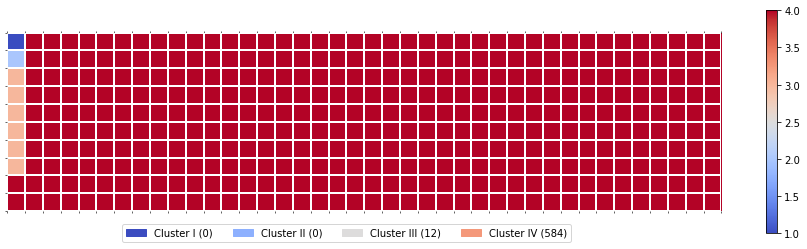

In [180]:
index = ['Cluster I', 'Cluster II', 'Cluster III', 'Cluster IV']
portions = [cl1.shape[0], cl4.shape[0], cl2.shape[0], cl3.shape[0]]
width = 40 # width of chart
height = 10 # height of chart

categories = index # categories
values = portions # correponding values of categories

colormap = plt.cm.coolwarm# color map class
create_waffle_chart(categories, values, height, width, colormap)